In [1]:
# xarray to read NETCDF
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import seaborn as sns
import cartopy.crs as ccrs
import cartopy.feature as cfeature
plt.rcParams['figure.dpi'] = 300

In [2]:
# Set index to be reindex to
new_lat = np.arange(-90, 90, 0.5)
new_lon = np.arange(-180, 180, 0.5)

# Opening all netCDF files
CanESM5 = xr.open_mfdataset('data/NMME/CanESM5/*.nc')
CanESM5 = CanESM5.assign_coords(X=(((CanESM5.X + 180) % 360) - 180)).sortby(['X'])
CanESM5 = CanESM5.reindex(X=new_lon, Y=new_lat).ffill('X').ffill('Y')

CCSM4 = xr.open_mfdataset('data/NMME/COLA-RSMAS-CCSM4/*.nc')
CCSM4 = CCSM4.assign_coords(X=(((CCSM4.X + 180) % 360) - 180)).sortby(['X'])
CCSM4 = CCSM4.reindex(X=new_lon, Y=new_lat).ffill('X').ffill('Y')

CESM1 = xr.open_mfdataset('data/NMME/COLA-RSMAS-CESM1/*.nc')
CESM1 = CESM1.assign_coords(X=(((CESM1.X + 180) % 360) - 180)).sortby(['X'])
CESM1 = CESM1.reindex(X=new_lon, Y=new_lat).ffill('X').ffill('Y')

GEM5 = xr.open_mfdataset('data/NMME/GEM5.2-NEMO/*.nc')
GEM5 = GEM5.assign_coords(X=(((GEM5.X + 180) % 360) - 180)).sortby(['X'])
GEM5 = GEM5.reindex(X=new_lon, Y=new_lat).ffill('X').ffill('Y')

GFDL = xr.open_mfdataset('data/NMME/GFDL-SPEAR/*.nc')
GFDL = GFDL.assign_coords(X=(((GFDL.X + 180) % 360) - 180)).sortby(['X'])
GFDL = GFDL.reindex(X=new_lon, Y=new_lat).ffill('X').ffill('Y')

NASA = xr.open_mfdataset('data/NMME/NASA-GEOSS2S/*.nc')
NASA = NASA.assign_coords(X=(((NASA.X + 180) % 360) - 180)).sortby(['X'])
NASA = NASA.reindex(X=new_lon, Y=new_lat).ffill('X').ffill('Y')

NCEP = xr.open_mfdataset('data/NMME/NCEP-CFSv2/*.nc')
NCEP = NCEP.assign_coords(X=(((NCEP.X + 180) % 360) - 180)).sortby(['X'])
NCEP = NCEP.reindex(X=new_lon, Y=new_lat).ffill('X').ffill('Y')

chirps = xr.open_dataset('data/CHIRPS/chirps-v2.0.monthly.nc')

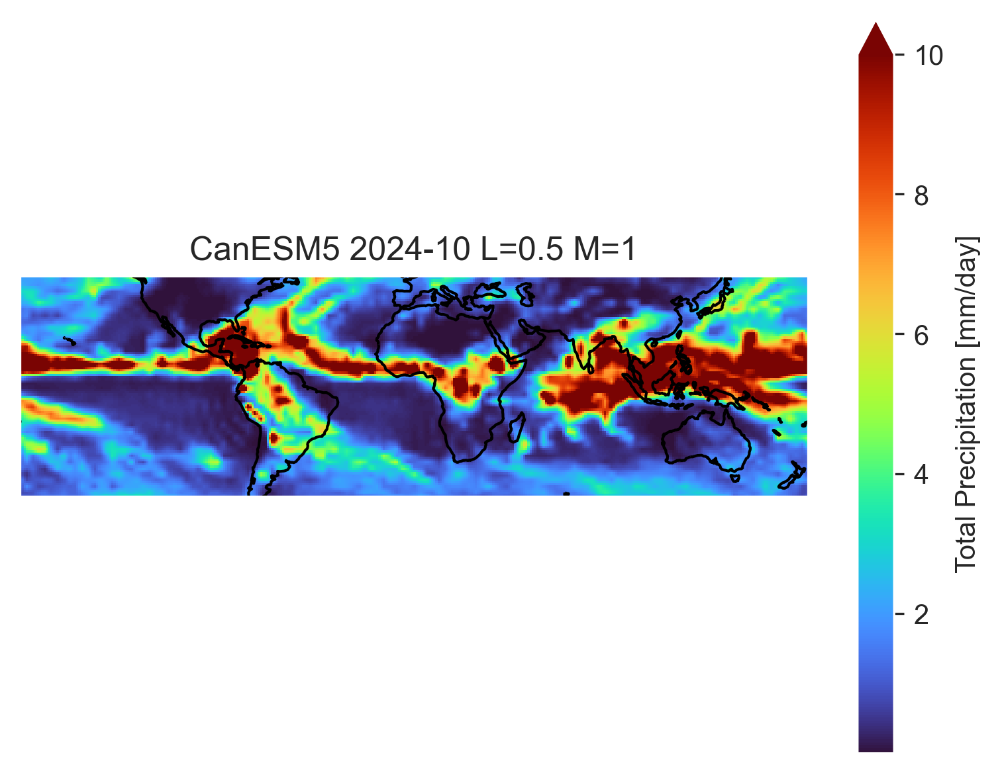

In [3]:
p = CanESM5.sel(S='2024-10', L=0.5, M=1, Y=slice(-50,50))['prec'].plot(
    subplot_kws=dict(projection=ccrs.PlateCarree(), facecolor="gray"),
    vmax=10, cmap='turbo'
)
plt.title('CanESM5 2024-10 L=0.5 M=1')
p.axes.coastlines()

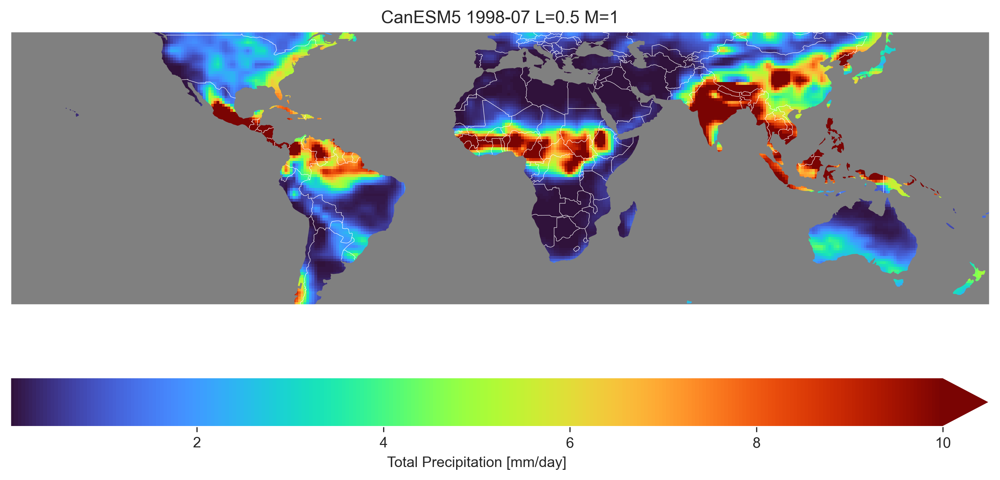

In [4]:
p = CanESM5.sel(S='1998-07', L=0.5, M=1, Y=slice(-50,50))['prec'].plot(
    subplot_kws=dict(projection=ccrs.PlateCarree()),
    transform=ccrs.PlateCarree(),
    vmax=10, cmap='turbo', figsize=(12,6), cbar_kwargs=dict(orientation='horizontal')
)
ax = p.axes
ax.add_feature(cfeature.OCEAN, facecolor='grey', edgecolor='none', zorder=2)
ax.add_feature(cfeature.BORDERS, linewidth=0.3, edgecolor="white")
plt.title('CanESM5 1998-07 L=0.5 M=1')
plt.savefig('figures/global_precip/CanESM5-1998-07.png')

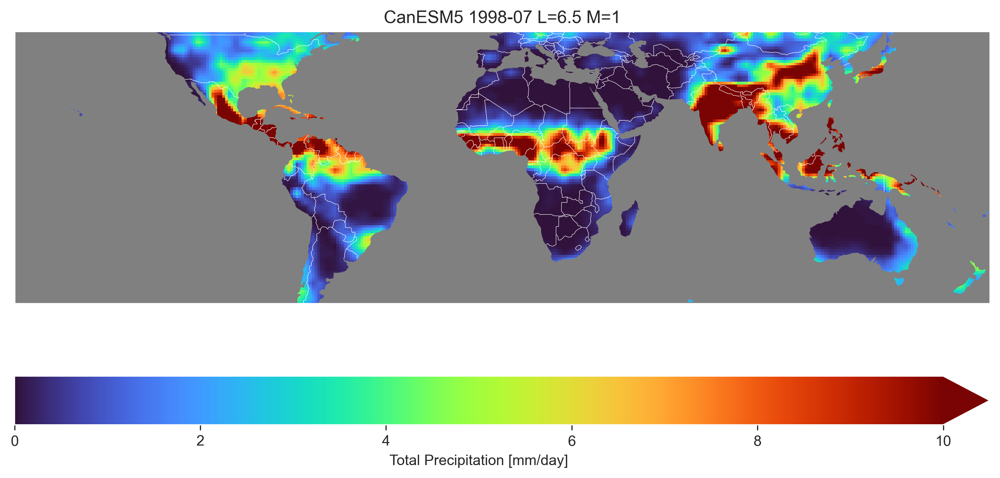

In [5]:
p = CanESM5.sel(S='1998-01', L=6.5, M=1, Y=slice(-50,50))['prec'].plot(
    subplot_kws=dict(projection=ccrs.PlateCarree()),
    transform=ccrs.PlateCarree(),
    vmax=10, cmap='turbo', figsize=(12,6), cbar_kwargs=dict(orientation='horizontal')
)
plt.title('CanESM5 1998-07 L=6.5 M=1')
ax = p.axes
ax.add_feature(cfeature.OCEAN, facecolor='grey', edgecolor='none', zorder=2)
ax.add_feature(cfeature.BORDERS, linewidth=0.3, edgecolor="white")
plt.savefig('figures/global_precip/CanESM5-1998-01.png')

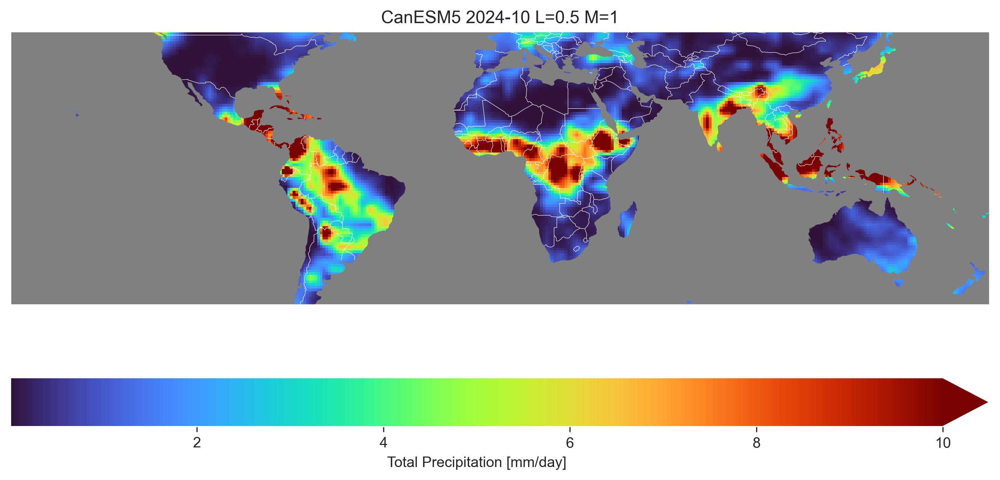

In [6]:
p = CanESM5.sel(S='2024-10', L=0.5, M=1, Y=slice(-50,50))['prec'].plot(
    subplot_kws=dict(projection=ccrs.PlateCarree()),
    transform=ccrs.PlateCarree(),
    vmax=10, cmap='turbo', figsize=(12,6), cbar_kwargs=dict(orientation='horizontal')
)
plt.title('CanESM5 2024-10 L=0.5 M=1')
ax = p.axes
ax.add_feature(cfeature.OCEAN, facecolor='grey', edgecolor='none', zorder=2)
ax.add_feature(cfeature.BORDERS, linewidth=0.3, edgecolor="white")
plt.savefig('figures/global_precip/CanESM5-2024-10.png')

In [7]:
p = CanESM5.sel(S='2024-05', L=5.5, M=1, Y=slice(-50,50))['prec'].plot(
    subplot_kws=dict(projection=ccrs.PlateCarree()),
    transform=ccrs.PlateCarree(),
    vmax=10, cmap='turbo', figsize=(12,6), cbar_kwargs=dict(orientation='horizontal')
)
plt.title('CanESM5 2024-10 L=5.5 M=1')
ax = p.axes
ax.add_feature(cfeature.OCEAN, facecolor='grey', edgecolor='none', zorder=2)
ax.add_feature(cfeature.BORDERS, linewidth=0.3, edgecolor="white")
plt.savefig('figures/global_precip/CanESM5-2024-05.png')

TypeError: No numeric data to plot.

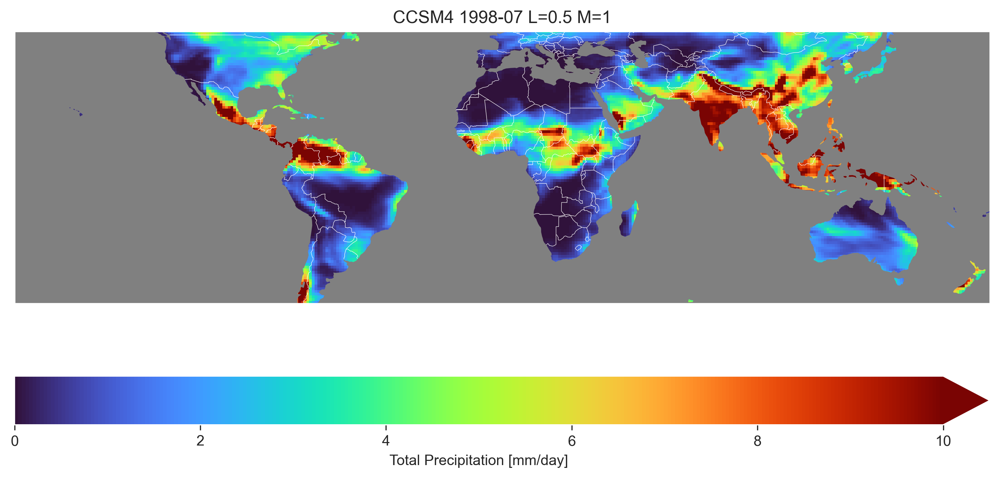

In [8]:
p = CCSM4.sel(S='1998-07', L=0.5, M=1, Y=slice(-50,50))['prec'].plot(
    subplot_kws=dict(projection=ccrs.PlateCarree()),
    transform=ccrs.PlateCarree(),
    vmax=10, cmap='turbo', figsize=(12,6), cbar_kwargs=dict(orientation='horizontal')
)
plt.title('CCSM4 1998-07 L=0.5 M=1')
ax = p.axes
ax.add_feature(cfeature.OCEAN, facecolor='grey', edgecolor='none', zorder=2)
ax.add_feature(cfeature.BORDERS, linewidth=0.3, edgecolor="white")
plt.savefig('figures/global_precip/CCSM4-1998-07.png')

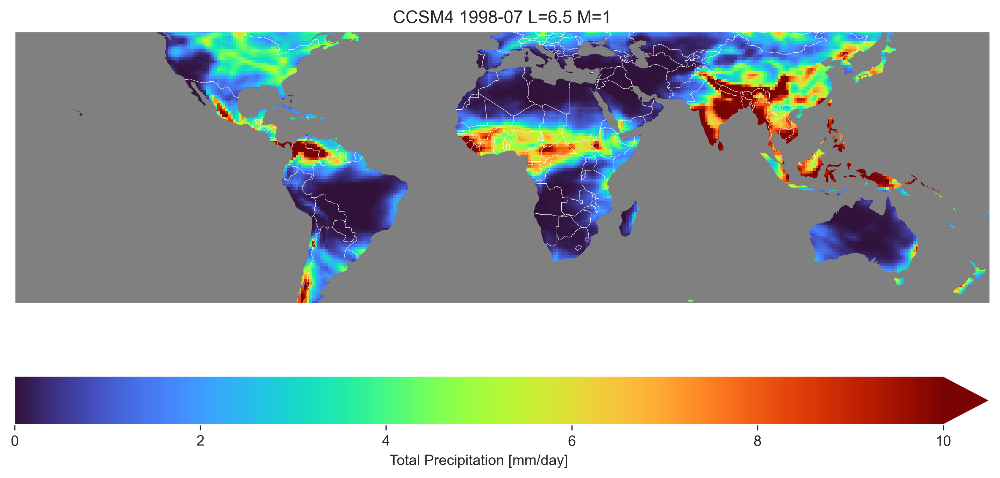

In [9]:
p = CCSM4.sel(S='1998-01', L=6.5, M=1, Y=slice(-50,50))['prec'].plot(
    subplot_kws=dict(projection=ccrs.PlateCarree()),
    transform=ccrs.PlateCarree(),
    vmax=10, cmap='turbo', figsize=(12,6), cbar_kwargs=dict(orientation='horizontal')
)
plt.title('CCSM4 1998-07 L=6.5 M=1')
ax = p.axes
ax.add_feature(cfeature.OCEAN, facecolor='grey', edgecolor='none', zorder=2)
ax.add_feature(cfeature.BORDERS, linewidth=0.3, edgecolor="white")
plt.savefig('figures/global_precip/CCSM4-1998-01.png')

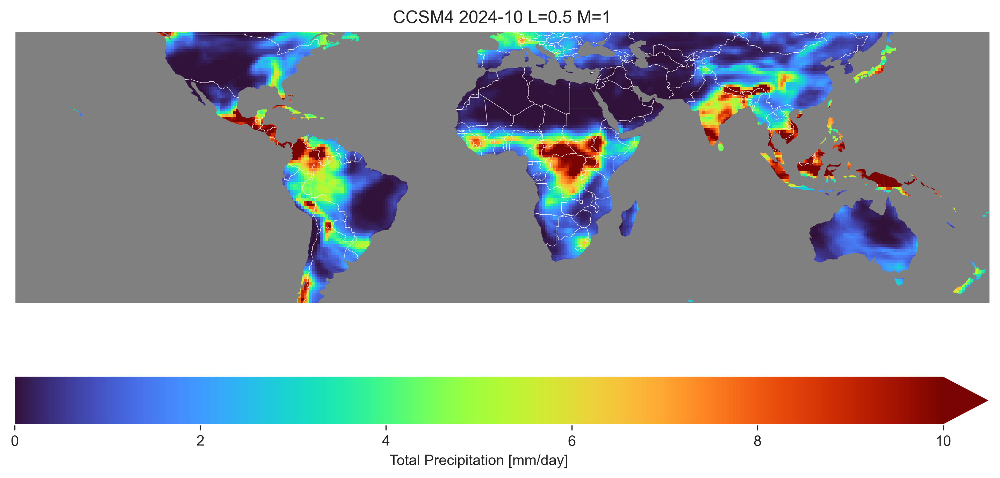

In [10]:
p = CCSM4.sel(S='2024-10', L=0.5, M=1, Y=slice(-50,50))['prec'].plot(
    subplot_kws=dict(projection=ccrs.PlateCarree()),
    transform=ccrs.PlateCarree(),
    vmax=10, cmap='turbo', figsize=(12,6), cbar_kwargs=dict(orientation='horizontal')
)
plt.title('CCSM4 2024-10 L=0.5 M=1')
ax = p.axes
ax.add_feature(cfeature.OCEAN, facecolor='grey', edgecolor='none', zorder=2)
ax.add_feature(cfeature.BORDERS, linewidth=0.3, edgecolor="white")
plt.savefig('figures/global_precip/CCSM4-2024-10.png')

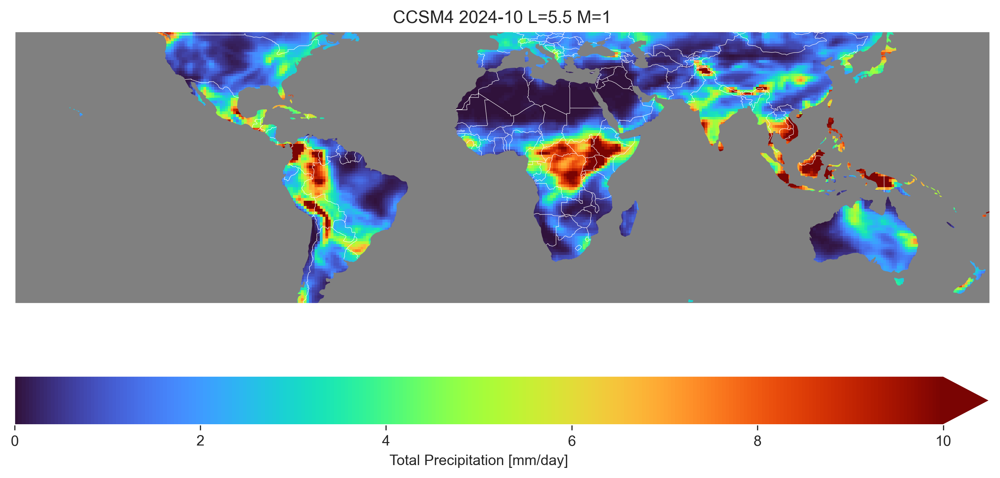

In [11]:
p = CCSM4.sel(S='2024-05', L=5.5, M=1, Y=slice(-50,50))['prec'].plot(
    subplot_kws=dict(projection=ccrs.PlateCarree()),
    transform=ccrs.PlateCarree(),
    vmax=10, cmap='turbo', figsize=(12,6), cbar_kwargs=dict(orientation='horizontal')
)
plt.title('CCSM4 2024-10 L=5.5 M=1')
ax = p.axes
ax.add_feature(cfeature.OCEAN, facecolor='grey', edgecolor='none', zorder=2)
ax.add_feature(cfeature.BORDERS, linewidth=0.3, edgecolor="white")
plt.savefig('figures/global_precip/CCSM4-2024-05.png')

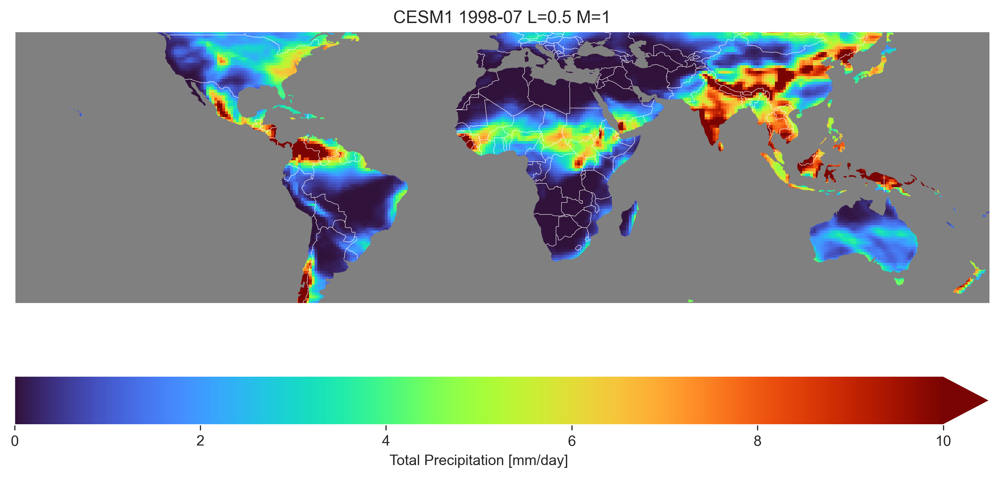

In [12]:
p = CESM1.sel(S='1998-07', L=0.5, M=1, Y=slice(-50,50))['prec'].plot(
    subplot_kws=dict(projection=ccrs.PlateCarree()),
    transform=ccrs.PlateCarree(),
    vmax=10, cmap='turbo', figsize=(12,6), cbar_kwargs=dict(orientation='horizontal')
)
plt.title('CESM1 1998-07 L=0.5 M=1')
ax = p.axes
ax.add_feature(cfeature.OCEAN, facecolor='grey', edgecolor='none', zorder=2)
ax.add_feature(cfeature.BORDERS, linewidth=0.3, edgecolor="white")
plt.savefig('figures/global_precip/CESM1-1998-07.png')

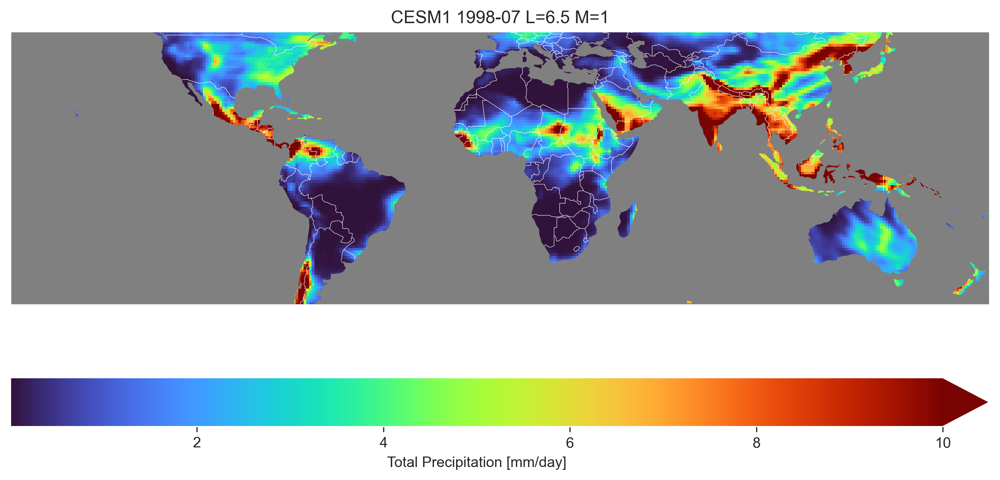

In [13]:
p = CESM1.sel(S='1998-01', L=6.5, M=1, Y=slice(-50,50))['prec'].plot(
    subplot_kws=dict(projection=ccrs.PlateCarree()),
    transform=ccrs.PlateCarree(),
    vmax=10, cmap='turbo', figsize=(12,6), cbar_kwargs=dict(orientation='horizontal')
)
plt.title('CESM1 1998-07 L=6.5 M=1')
ax = p.axes
ax.add_feature(cfeature.OCEAN, facecolor='grey', edgecolor='none', zorder=2)
ax.add_feature(cfeature.BORDERS, linewidth=0.3, edgecolor="white")
plt.savefig('figures/global_precip/CESM1-1998-01.png')

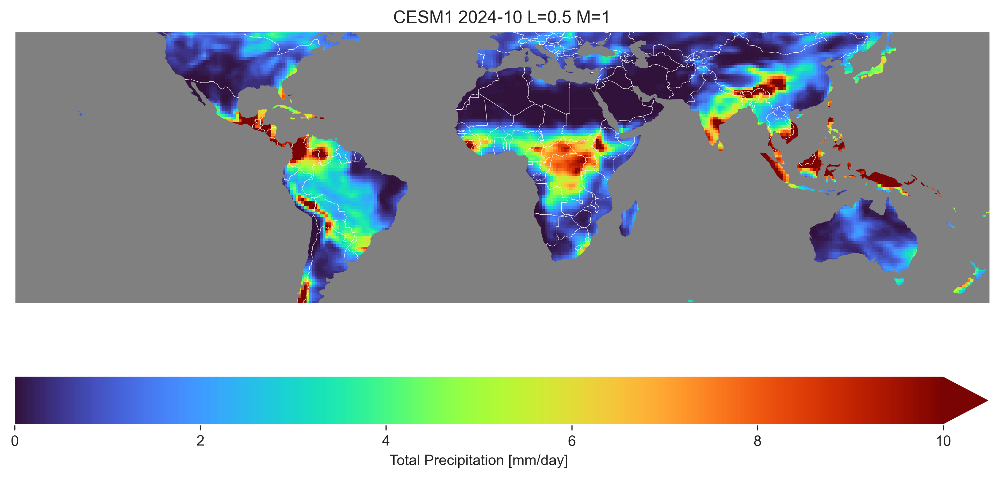

In [14]:
p = CESM1.sel(S='2024-10', L=0.5, M=1, Y=slice(-50,50))['prec'].plot(
    subplot_kws=dict(projection=ccrs.PlateCarree()),
    transform=ccrs.PlateCarree(),
    vmax=10, cmap='turbo', figsize=(12,6), cbar_kwargs=dict(orientation='horizontal')
)
plt.title('CESM1 2024-10 L=0.5 M=1')
ax = p.axes
ax.add_feature(cfeature.OCEAN, facecolor='grey', edgecolor='none', zorder=2)
ax.add_feature(cfeature.BORDERS, linewidth=0.3, edgecolor="white")
plt.savefig('figures/global_precip/CESM1-2024-10.png')

In [15]:
p = CESM1.sel(S='2024-05', L=5.5, M=1, Y=slice(-50,50))['prec'].plot(
    subplot_kws=dict(projection=ccrs.PlateCarree()),
    transform=ccrs.PlateCarree(),
    vmax=10, cmap='turbo', figsize=(12,6), cbar_kwargs=dict(orientation='horizontal')
)
plt.title('CESM1 2024-10 L=5.5 M=1')
ax = p.axes
ax.add_feature(cfeature.OCEAN, facecolor='grey', edgecolor='none', zorder=2)
ax.add_feature(cfeature.BORDERS, linewidth=0.3, edgecolor="white")
plt.savefig('figures/global_precip/CESM1-2024-05.png')

TypeError: No numeric data to plot.

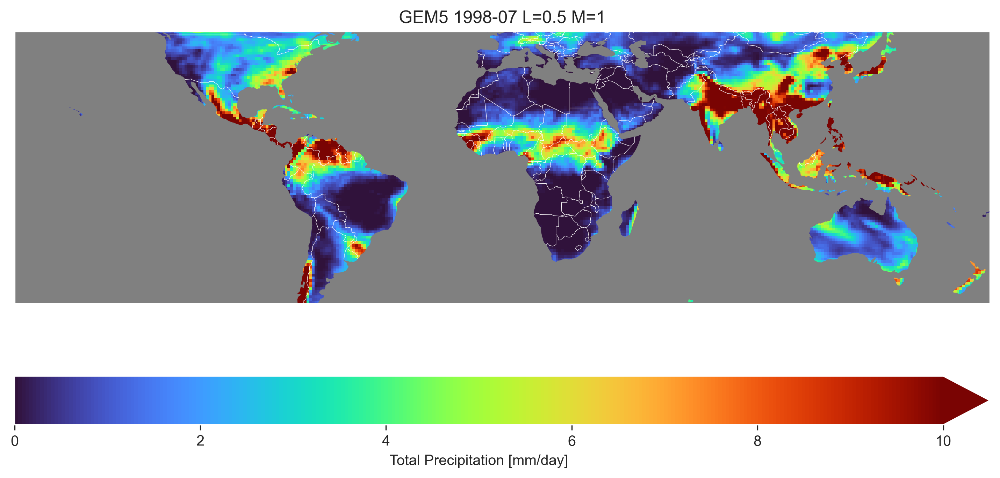

In [16]:
p = GEM5.sel(S='1998-07', L=0.5, M=1, Y=slice(-50,50))['prec'].plot(
    subplot_kws=dict(projection=ccrs.PlateCarree()),
    transform=ccrs.PlateCarree(),
    vmax=10, cmap='turbo', figsize=(12,6), cbar_kwargs=dict(orientation='horizontal')
)
plt.title('GEM5 1998-07 L=0.5 M=1')
ax = p.axes
ax.add_feature(cfeature.OCEAN, facecolor='grey', edgecolor='none', zorder=2)
ax.add_feature(cfeature.BORDERS, linewidth=0.3, edgecolor="white")
plt.savefig('figures/global_precip/GEM5-1998-07.png')

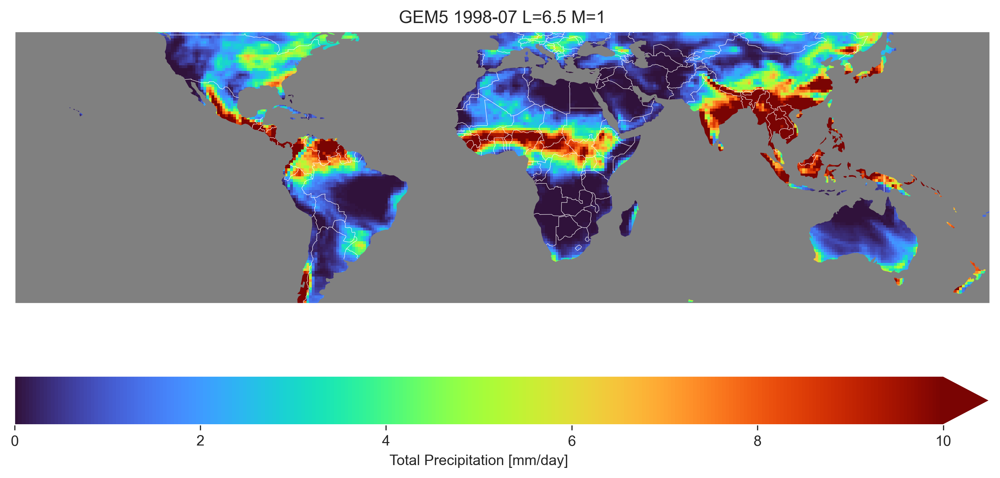

In [17]:
p = GEM5.sel(S='1998-01', L=6.5, M=1, Y=slice(-50,50))['prec'].plot(
    subplot_kws=dict(projection=ccrs.PlateCarree()),
    transform=ccrs.PlateCarree(),
    vmax=10, cmap='turbo', figsize=(12,6), cbar_kwargs=dict(orientation='horizontal')
)
plt.title('GEM5 1998-07 L=6.5 M=1')
ax = p.axes
ax.add_feature(cfeature.OCEAN, facecolor='grey', edgecolor='none', zorder=2)
ax.add_feature(cfeature.BORDERS, linewidth=0.3, edgecolor="white")
plt.savefig('figures/global_precip/GEM5-1998-01.png')

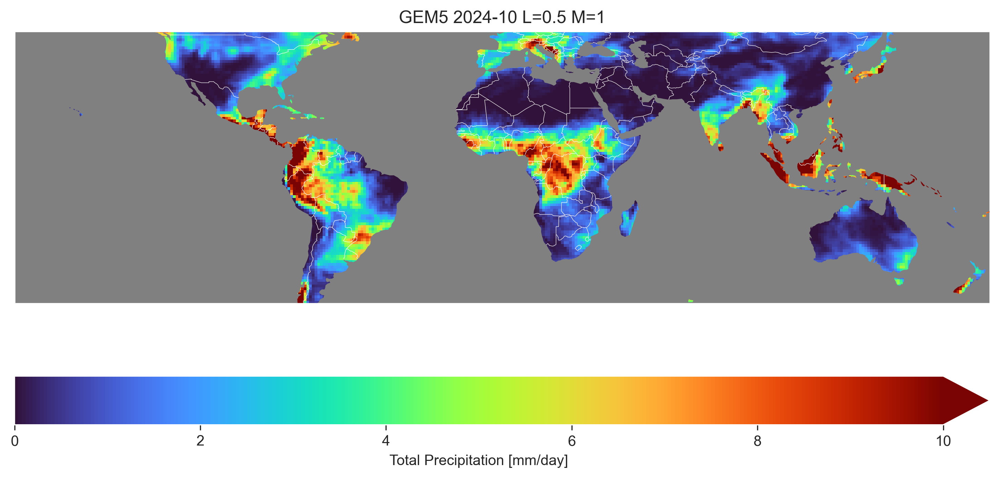

In [18]:
p = GEM5.sel(S='2024-10', L=0.5, M=1, Y=slice(-50,50))['prec'].plot(
    subplot_kws=dict(projection=ccrs.PlateCarree()),
    transform=ccrs.PlateCarree(),
    vmax=10, cmap='turbo', figsize=(12,6), cbar_kwargs=dict(orientation='horizontal')
)
plt.title('GEM5 2024-10 L=0.5 M=1')
ax = p.axes
ax.add_feature(cfeature.OCEAN, facecolor='grey', edgecolor='none', zorder=2)
ax.add_feature(cfeature.BORDERS, linewidth=0.3, edgecolor="white")
plt.savefig('figures/global_precip/GEM5-2024-10.png')

In [19]:
p = GEM5.sel(S='2024-05', L=5.5, M=1, Y=slice(-50,50))['prec'].plot(
    subplot_kws=dict(projection=ccrs.PlateCarree()),
    transform=ccrs.PlateCarree(),
    vmax=10, cmap='turbo', figsize=(12,6), cbar_kwargs=dict(orientation='horizontal')
)
plt.title('GEM5 2024-10 L=5.5 M=1')
ax = p.axes
ax.add_feature(cfeature.OCEAN, facecolor='grey', edgecolor='none', zorder=2)
ax.add_feature(cfeature.BORDERS, linewidth=0.3, edgecolor="white")
plt.savefig('figures/global_precip/GEM5-2024-05.png')

TypeError: No numeric data to plot.

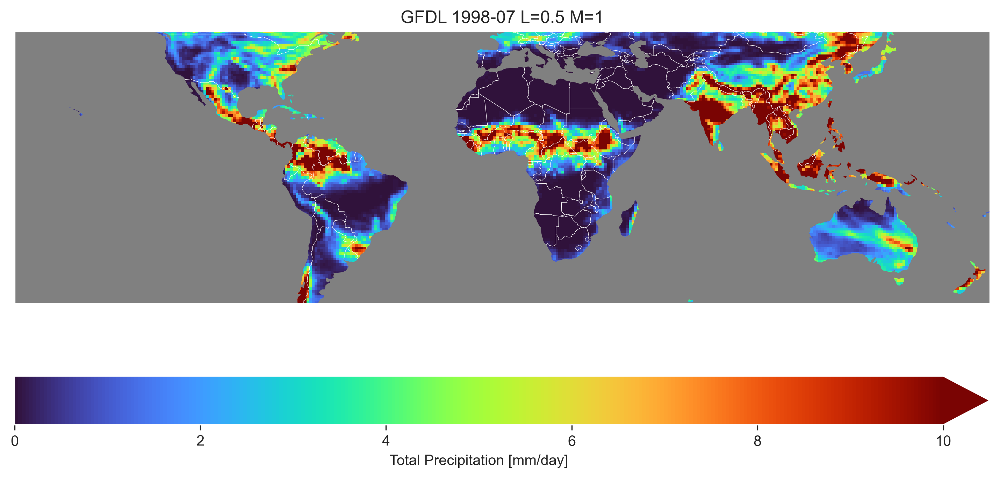

In [20]:
p = GFDL.sel(S='1998-07', L=0.5, M=1, Y=slice(-50,50))['prec'].plot(
    subplot_kws=dict(projection=ccrs.PlateCarree()),
    transform=ccrs.PlateCarree(),
    vmax=10, cmap='turbo', figsize=(12,6), cbar_kwargs=dict(orientation='horizontal')
)
plt.title('GFDL 1998-07 L=0.5 M=1')
ax = p.axes
ax.add_feature(cfeature.OCEAN, facecolor='grey', edgecolor='none', zorder=2)
ax.add_feature(cfeature.BORDERS, linewidth=0.3, edgecolor="white")
plt.savefig('figures/global_precip/GFDL-1998-07.png')

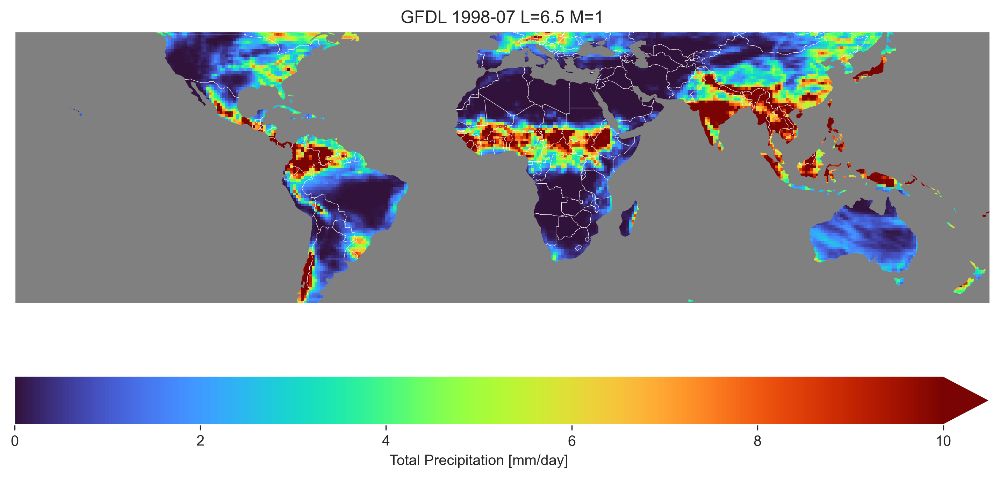

In [21]:
p = GFDL.sel(S='1998-01', L=6.5, M=1, Y=slice(-50,50))['prec'].plot(
    subplot_kws=dict(projection=ccrs.PlateCarree()),
    transform=ccrs.PlateCarree(),
    vmax=10, cmap='turbo', figsize=(12,6), cbar_kwargs=dict(orientation='horizontal')
)
plt.title('GFDL 1998-07 L=6.5 M=1')
ax = p.axes
ax.add_feature(cfeature.OCEAN, facecolor='grey', edgecolor='none', zorder=2)
ax.add_feature(cfeature.BORDERS, linewidth=0.3, edgecolor="white")
plt.savefig('figures/global_precip/GFDL-1998-01.png')

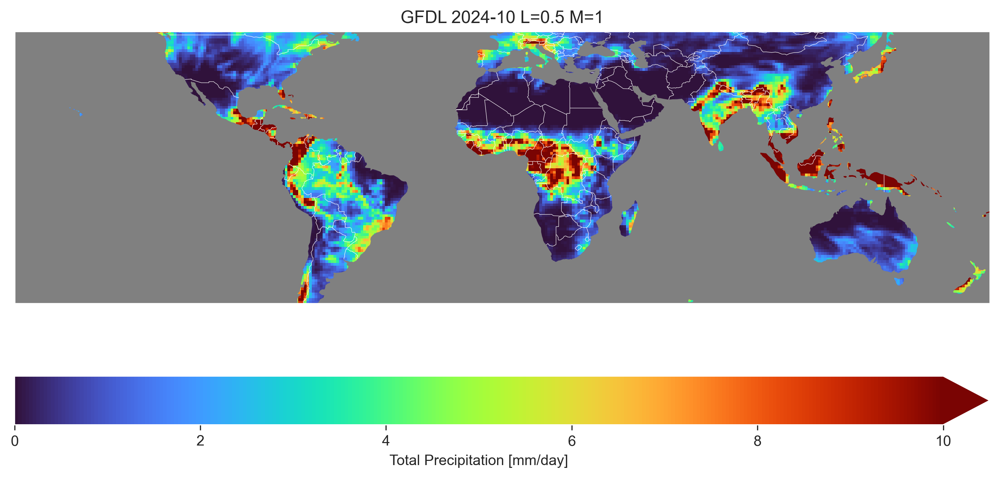

In [23]:
p = GFDL.sel(S='2024-10', L=0.5, M=1, Y=slice(-50,50))['prec'].plot(
    subplot_kws=dict(projection=ccrs.PlateCarree()),
    transform=ccrs.PlateCarree(),
    vmax=10, cmap='turbo', figsize=(12,6), cbar_kwargs=dict(orientation='horizontal')
)
plt.title('GFDL 2024-10 L=0.5 M=1')
ax = p.axes
ax.add_feature(cfeature.OCEAN, facecolor='grey', edgecolor='none', zorder=2)
ax.add_feature(cfeature.BORDERS, linewidth=0.3, edgecolor="white")
plt.savefig('figures/global_precip/GFDL-2024-10.png')

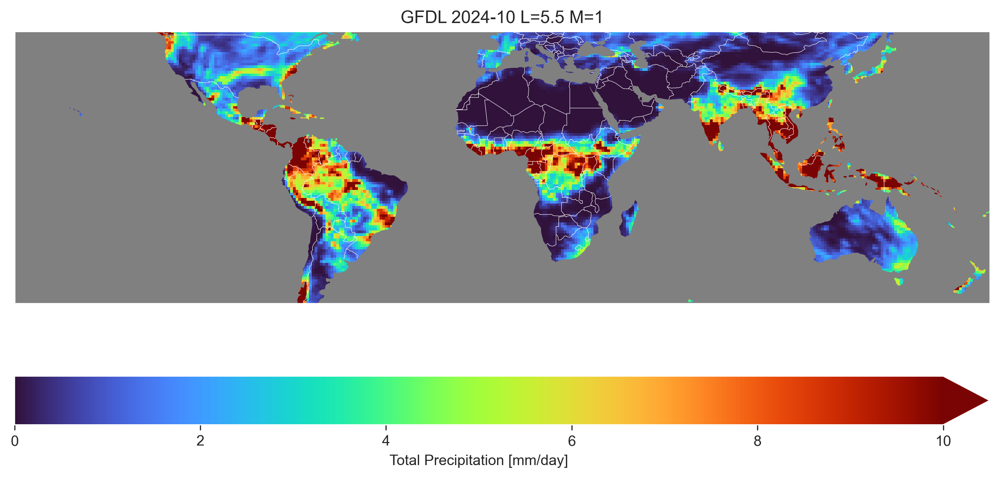

In [22]:
p = GFDL.sel(S='2024-05', L=5.5, M=1, Y=slice(-50,50))['prec'].plot(
    subplot_kws=dict(projection=ccrs.PlateCarree()),
    transform=ccrs.PlateCarree(),
    vmax=10, cmap='turbo', figsize=(12,6), cbar_kwargs=dict(orientation='horizontal')
)
plt.title('GFDL 2024-10 L=5.5 M=1')
ax = p.axes
ax.add_feature(cfeature.OCEAN, facecolor='grey', edgecolor='none', zorder=2)
ax.add_feature(cfeature.BORDERS, linewidth=0.3, edgecolor="white")
plt.savefig('figures/global_precip/GFDL-2024_05.png')

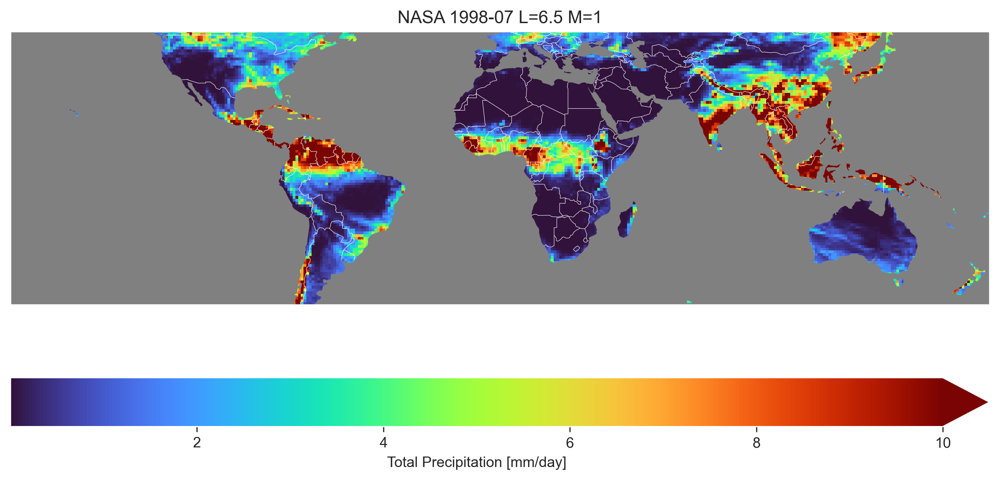

In [24]:
p = NASA.sel(S='1998-01', L=6.5, M=1, Y=slice(-50,50))['prec'].plot(
    subplot_kws=dict(projection=ccrs.PlateCarree()),
    transform=ccrs.PlateCarree(),
    vmax=10, cmap='turbo', figsize=(12,6), cbar_kwargs=dict(orientation='horizontal')
)

plt.title('NASA 1998-07 L=6.5 M=1')
ax = p.axes
ax.add_feature(cfeature.OCEAN, facecolor='grey', edgecolor='none', zorder=2)
ax.add_feature(cfeature.BORDERS, linewidth=0.3, edgecolor="white")
plt.savefig('figures/global_precip/NASA-1998-01.png')

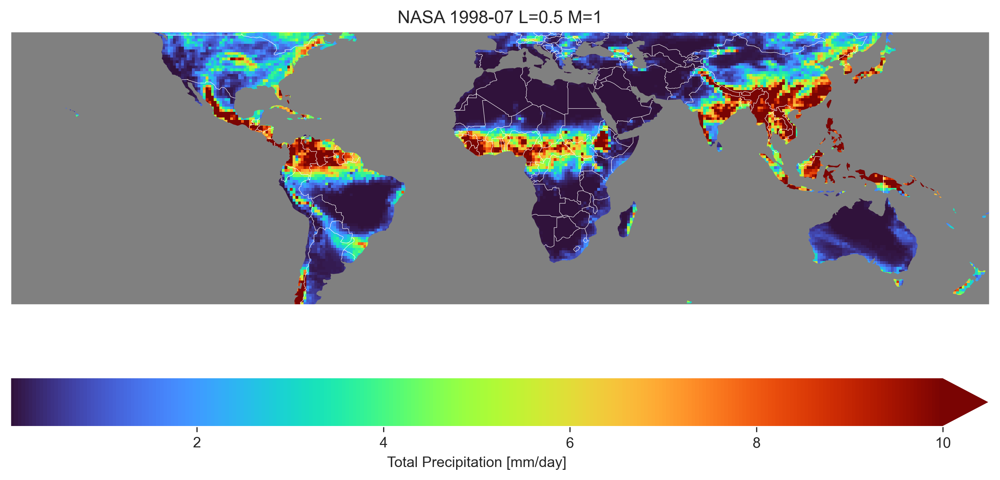

In [25]:
p = NASA.sel(S='1998-07', L=0.5, M=1, Y=slice(-50,50))['prec'].plot(
    subplot_kws=dict(projection=ccrs.PlateCarree()),
    transform=ccrs.PlateCarree(),
    vmax=10, cmap='turbo', figsize=(12,6), cbar_kwargs=dict(orientation='horizontal')
)

plt.title('NASA 1998-07 L=0.5 M=1')
ax = p.axes
ax.add_feature(cfeature.OCEAN, facecolor='grey', edgecolor='none', zorder=2)
ax.add_feature(cfeature.BORDERS, linewidth=0.3, edgecolor="white")
plt.savefig('figures/global_precip/NASA-1998-07.png')

In [101]:
'''p = NASA.sel(S='2024-10', L=0.5, M=1, Y=slice(-50,50))['prec'].plot(
    subplot_kws=dict(projection=ccrs.PlateCarree()),
    transform=ccrs.PlateCarree(),
    vmax=10, cmap='turbo', figsize=(12,6), cbar_kwargs=dict(orientation='horizontal')
)

ax = p.axes
ax.add_feature(cfeature.OCEAN, facecolor='grey', edgecolor='none', zorder=2)
ax.add_feature(cfeature.BORDERS, linewidth=0.3, edgecolor="white")'''

'p = NASA.sel(S=\'2024-10\', L=0.5, M=1, Y=slice(-50,50))[\'prec\'].plot(\n    subplot_kws=dict(projection=ccrs.PlateCarree()),\n    transform=ccrs.PlateCarree(),\n    vmax=10, cmap=\'turbo\', figsize=(12,6), cbar_kwargs=dict(orientation=\'horizontal\')\n)\n\nax = p.axes\nax.add_feature(cfeature.OCEAN, facecolor=\'grey\', edgecolor=\'none\', zorder=2)\nax.add_feature(cfeature.BORDERS, linewidth=0.3, edgecolor="white")'

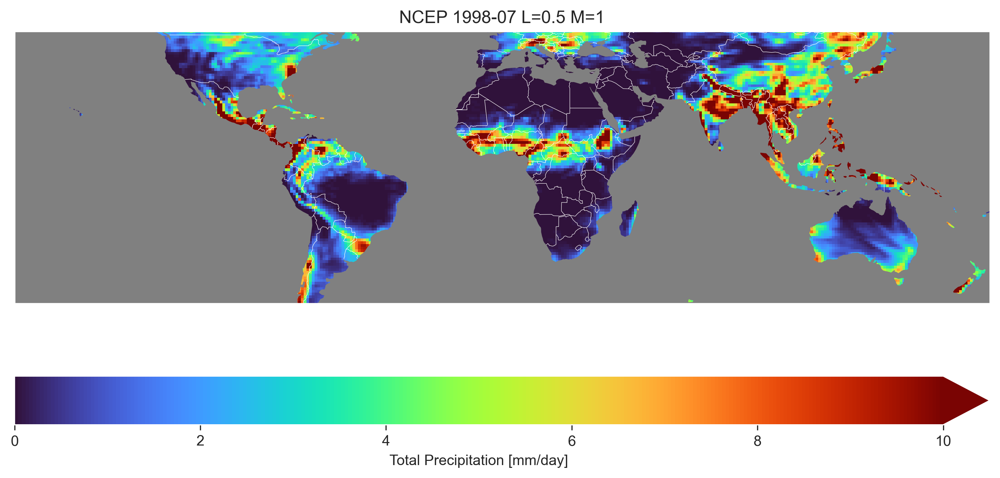

In [26]:
p = NCEP.sel(S='1998-07', L=0.5, M=1, Y=slice(-50,50))['prec'].plot(
    subplot_kws=dict(projection=ccrs.PlateCarree()),
    transform=ccrs.PlateCarree(),
    vmax=10, cmap='turbo', figsize=(12,6), cbar_kwargs=dict(orientation='horizontal')
)
plt.title('NCEP 1998-07 L=0.5 M=1')
ax = p.axes
ax.add_feature(cfeature.OCEAN, facecolor='grey', edgecolor='none', zorder=2)
ax.add_feature(cfeature.BORDERS, linewidth=0.3, edgecolor="white")
plt.savefig('figures/global_precip/NCEP-1998-07.png')

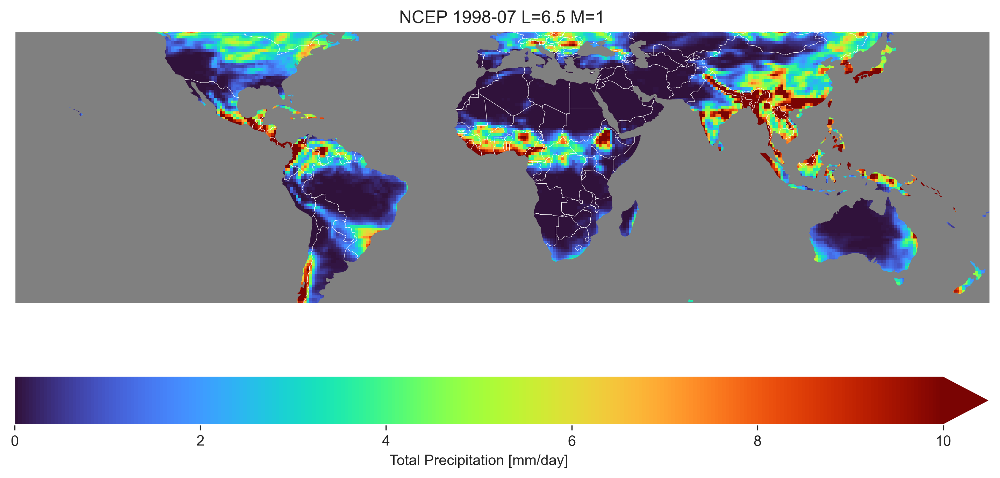

In [27]:
p = NCEP.sel(S='1998-01', L=6.5, M=1, Y=slice(-50,50))['prec'].plot(
    subplot_kws=dict(projection=ccrs.PlateCarree()),
    transform=ccrs.PlateCarree(),
    vmax=10, cmap='turbo', figsize=(12,6), cbar_kwargs=dict(orientation='horizontal')
)
plt.title('NCEP 1998-07 L=6.5 M=1')
ax = p.axes
ax.add_feature(cfeature.OCEAN, facecolor='grey', edgecolor='none', zorder=2)
ax.add_feature(cfeature.BORDERS, linewidth=0.3, edgecolor="white")
plt.savefig('figures/global_precip/NCEP-1998-01.png')

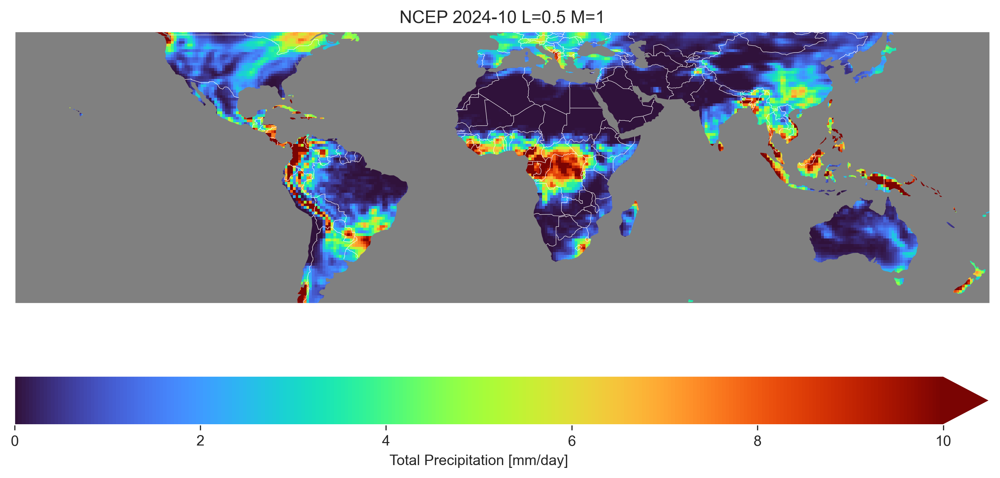

In [28]:
p = NCEP.sel(S='2024-10', L=0.5, M=1, Y=slice(-50,50))['prec'].plot(
    subplot_kws=dict(projection=ccrs.PlateCarree()),
    transform=ccrs.PlateCarree(),
    vmax=10, cmap='turbo', figsize=(12,6), cbar_kwargs=dict(orientation='horizontal')
)
plt.title('NCEP 2024-10 L=0.5 M=1')
ax = p.axes
ax.add_feature(cfeature.OCEAN, facecolor='grey', edgecolor='none', zorder=2)
ax.add_feature(cfeature.BORDERS, linewidth=0.3, edgecolor="white")
plt.savefig('figures/global_precip/NCEP-2024_10.png')

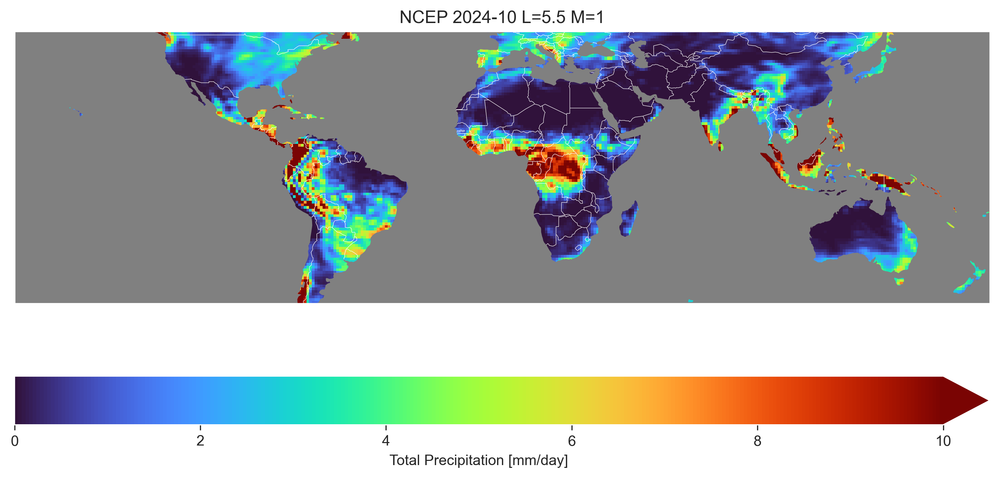

In [29]:
p = NCEP.sel(S='2024-05', L=5.5, M=1, Y=slice(-50,50))['prec'].plot(
    subplot_kws=dict(projection=ccrs.PlateCarree()),
    transform=ccrs.PlateCarree(),
    vmax=10, cmap='turbo', figsize=(12,6), cbar_kwargs=dict(orientation='horizontal')
)
plt.title('NCEP 2024-10 L=5.5 M=1')
ax = p.axes
ax.add_feature(cfeature.OCEAN, facecolor='grey', edgecolor='none', zorder=2)
ax.add_feature(cfeature.BORDERS, linewidth=0.3, edgecolor="white")
plt.savefig('figures/global_precip/NCEP-2024-05.png')

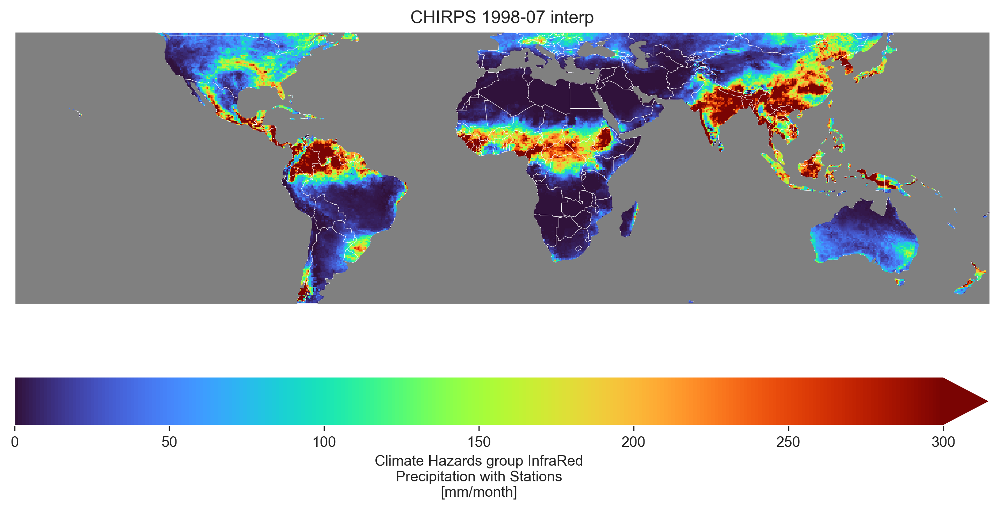

In [30]:
ds = CanESM5.sel(S='1998-07', L=0.5, M=1, Y=slice(-50,50)).rename({'Y': 'latitude', 'X': 'longitude', 'prec': 'predicted precip', 'S': 'date of prediction', 'L': 'lead time'})

p = chirps.sel(time='1998-07').interp_like(ds, method='nearest')['precip'].plot(
    subplot_kws=dict(projection=ccrs.PlateCarree()),
    transform=ccrs.PlateCarree(),
    vmax=300, cmap='turbo', figsize=(12,6), cbar_kwargs=dict(orientation='horizontal')
)
plt.title('CHIRPS 1998-07 interp')
ax = p.axes
ax.add_feature(cfeature.OCEAN, facecolor='grey', edgecolor='none', zorder=2)
ax.add_feature(cfeature.BORDERS, linewidth=0.3, edgecolor="white")
plt.savefig('figures/global_precip/CHIRPS-1998_07-interp.png')

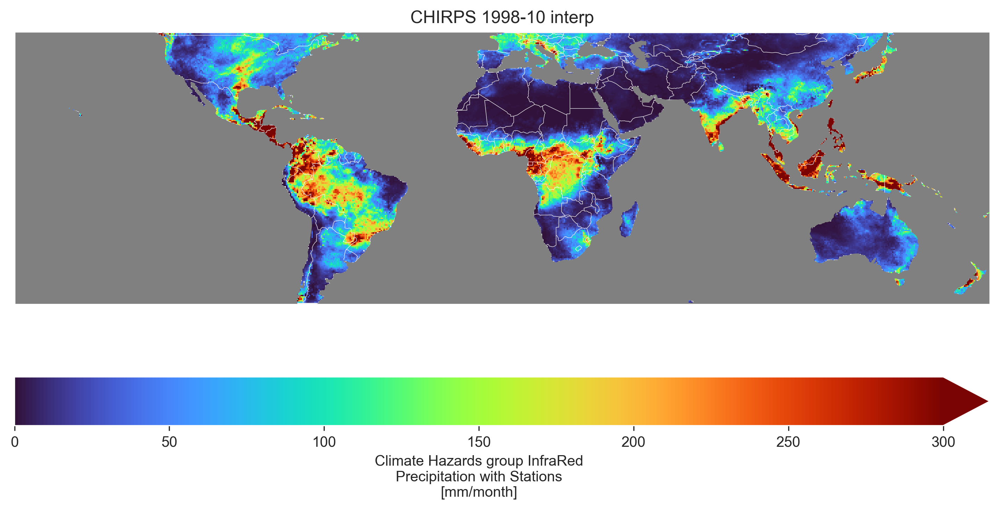

In [31]:
ds = CanESM5.sel(S='1998-10', L=0.5, M=1, Y=slice(-50,50)).rename({'Y': 'latitude', 'X': 'longitude', 'prec': 'predicted precip', 'S': 'date of prediction', 'L': 'lead time'})

p = chirps.sel(time='1998-10').interp_like(ds, method='nearest')['precip'].plot(
    subplot_kws=dict(projection=ccrs.PlateCarree()),
    transform=ccrs.PlateCarree(),
    vmax=300, cmap='turbo', figsize=(12,6), cbar_kwargs=dict(orientation='horizontal')
)
plt.title('CHIRPS 1998-10 interp')
ax = p.axes
ax.add_feature(cfeature.OCEAN, facecolor='grey', edgecolor='none', zorder=2)
ax.add_feature(cfeature.BORDERS, linewidth=0.3, edgecolor="white")
plt.savefig('figures/global_precip/CHIRPS-1998_10-interp.png')

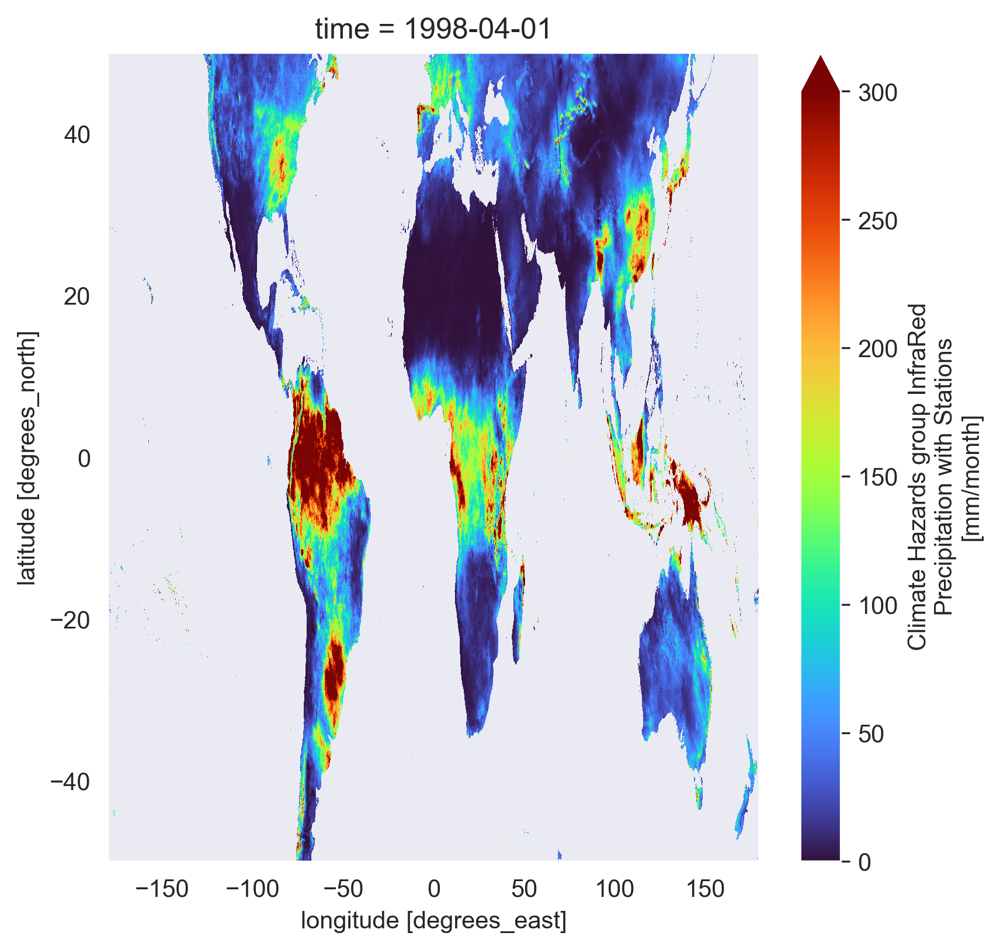

In [32]:
p = chirps.sel(time='1998-04')['precip'].plot(
    vmax=300, cmap='turbo', figsize=(6,6)
)
plt.savefig('figures/global_precip/raw-chirps.png')

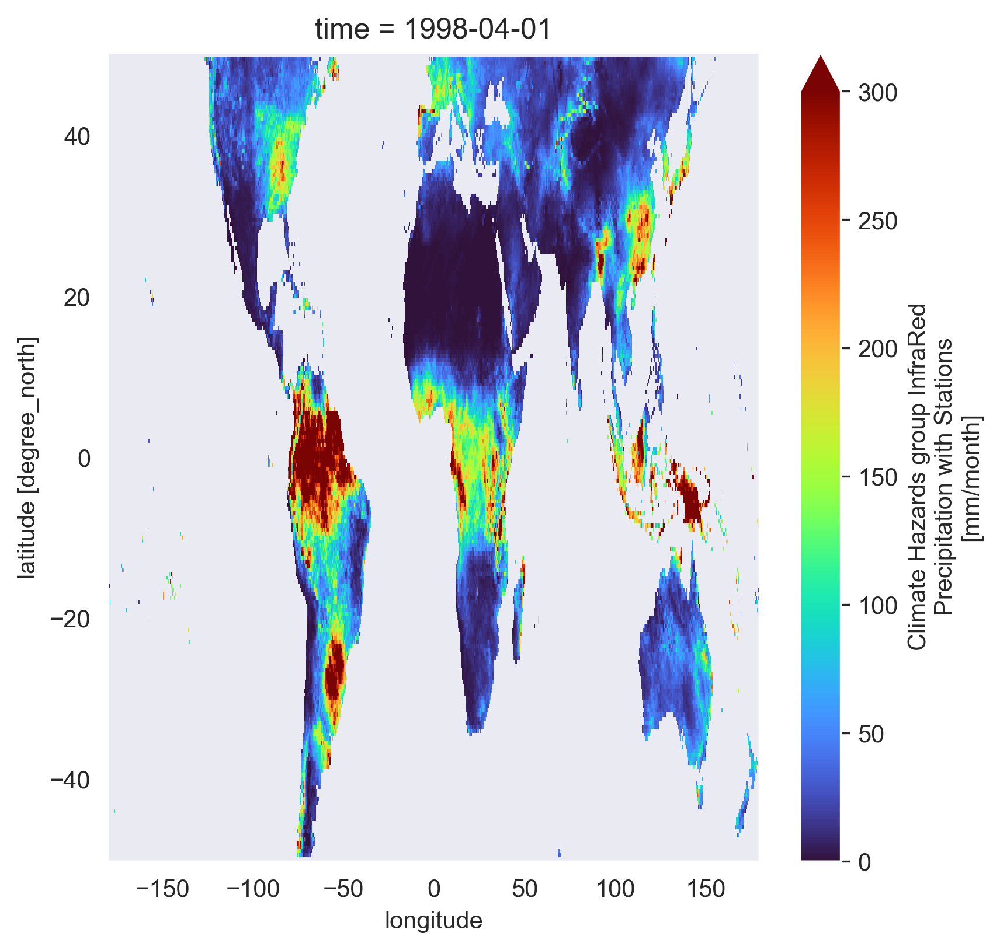

In [33]:
ds = CanESM5.sel(S='1998-04', L=0.5, M=1, Y=slice(-50,50)).rename({'Y': 'latitude', 'X': 'longitude', 'prec': 'predicted precip', 'S': 'date of prediction', 'L': 'lead time'})

p = chirps.sel(time='1998-04').interp_like(ds, method='nearest')['precip'].plot(
    vmax=300, cmap='turbo', figsize=(6,6)
)

plt.savefig('figures/global_precip/interp-chirps.png')

In [ ]:
p = chirps.sel(time='2024-10')['precip'].plot(
    subplot_kws=dict(projection=ccrs.PlateCarree()),
    transform=ccrs.PlateCarree(),
    vmax=300, cmap='turbo', figsize=(12,6), cbar_kwargs=dict(orientation='horizontal')
)
plt.title('CHIRPS 2024-10')
ax = p.axes
ax.add_feature(cfeature.OCEAN, facecolor='grey', edgecolor='none', zorder=2)
ax.add_feature(cfeature.BORDERS, linewidth=0.3, edgecolor="white")
plt.savefig('figures/global_precip/CHIRPS-2024_10.png')

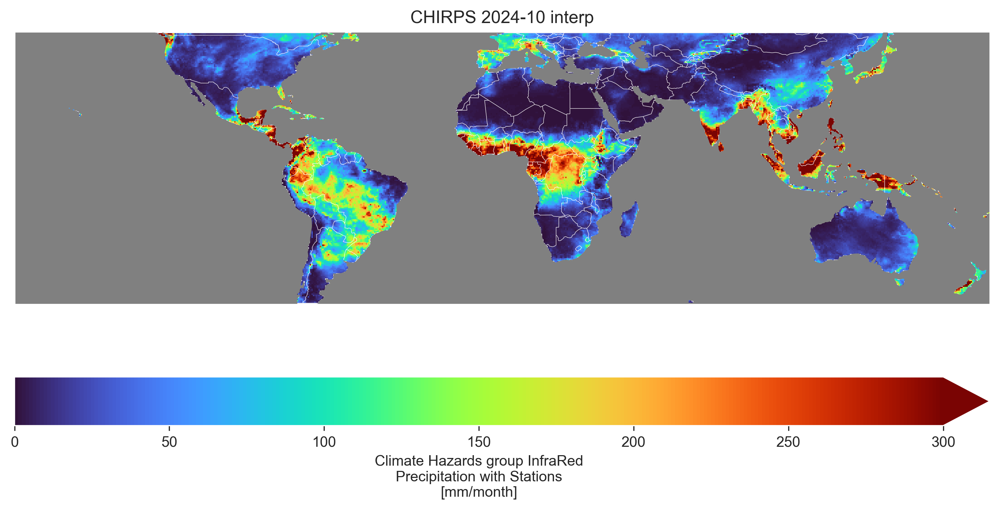

In [112]:
ds = CanESM5.sel(S='2024-10', L=0.5, M=1, Y=slice(-50,50)).rename({'Y': 'latitude', 'X': 'longitude', 'prec': 'predicted precip', 'S': 'date of prediction', 'L': 'lead time'})

p = chirps.sel(time='2024-10').interp_like(ds, method='nearest')['precip'].plot(
    subplot_kws=dict(projection=ccrs.PlateCarree()),
    transform=ccrs.PlateCarree(),
    vmax=300, cmap='turbo', figsize=(12,6), cbar_kwargs=dict(orientation='horizontal')
)
plt.title('CHIRPS 2024-10 interp')
ax = p.axes
ax.add_feature(cfeature.OCEAN, facecolor='grey', edgecolor='none', zorder=2)
ax.add_feature(cfeature.BORDERS, linewidth=0.3, edgecolor="white")
plt.savefig('figures/global_precip/CHIRPS-2024_10-interp.png')